# Deep Reinforcement Learning Class Spring 2025 Assignment 3

This is the first part of the assignment. In this part, you will learn DQN and its variants with the LunarLander environment from OpenAI Gym.

You need to fill in the missing code snippets (marked by TODO). Feel free to modify the code structure based on your understanding, but **you are forbidden to use any external RL libraries like Stable Baselines3**, **RLlib**, etc.

Make a copy of this notebook using File > Save a copy in Drive and edit it with your answers.

WARNING: Do not put your name or any other personal identification information in this notebook.

## Quention 1: LunarLander and Random Agent (5%)

We will start by loading the LunarLander environment and creating a random agent.

First, install the required packages and import the necessary libraries.

In [2]:
!pip install swig
!pip install gymnasium[box2d]
!pip install torch
!pip install numpy
!pip install matplotlib
!pip install imageio

  Using cached matplotlib-3.10.1-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (11 kB)
  Using cached contourpy-1.3.1-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (5.4 kB)
  Using cached cycler-0.12.1-py3-none-any.whl.metadata (3.8 kB)
  Using cached kiwisolver-1.4.8-cp310-cp310-manylinux_2_12_x86_64.manylinux2010_x86_64.whl.metadata (6.2 kB)
Using cached matplotlib-3.10.1-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (8.6 MB)
Using cached contourpy-1.3.1-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (324 kB)
Using cached cycler-0.12.1-py3-none-any.whl (8.3 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.6/4.6 MB 2.1 MB/s eta 0:00:00a 0:00:01
Using cached kiwisolver-1.4.8-cp310-cp310-manylinux_2_12_x86_64.manylinux2010_x86_64.whl (1.6 MB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.6/4.6 MB 639.4 kB/s eta 0:00:00a 0:00:01
  Using cached imageio-2.37.0-py3-none-any.whl.metadata (5.2 kB)
Using cached imageio-2.37.

In [1]:
import gymnasium as gym
import os
import matplotlib.pyplot as plt
import imageio
import numpy as np
from IPython.display import Image
import torch
import random
from collections import deque

### Understanding the LunarLander Environment

The LunarLander environment simulates a 2D lunar landing task, where an agent (a spacecraft) must learn to land safely on a designated landing pad. The lander is controlled using discrete actions that fire its engines in different directions

More information about the environment can be found [here](https://gymnasium.farama.org/environments/box2d/lunar_lander/).

In [2]:
env = gym.make("LunarLander-v3", render_mode="rgb_array")
action_size = env.action_space.n
print("action size: ", action_size)
state_size = env.observation_space.shape[0]
print("state size: ", state_size)

action size:  4
state size:  8


### Implementing the Random Agent (5%)

We will implement a random agent that selects actions randomly from the action space of the environment. Random agents are useful for testing the environment and ensuring that it is working as expected.


Total reward: -424.6151618119293


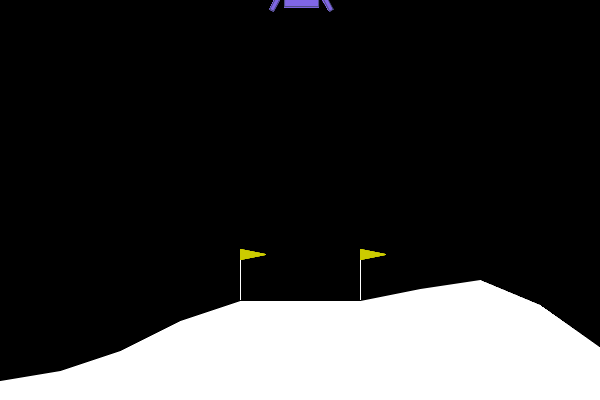

In [19]:
frames = [] # Store the frames for the animation

observation, _ = env.reset()
done = False
total_reward = 0
while not done:
    # TODO: Select an action randomly
    action = random.choice(list(range(action_size)))

    # TODO: Take a step in the environment
    observation, reward, terminated, truncated, info = env.step(action)

    # TODO: Check if the episode is done
    done = terminated or truncated

    # TODO: Update the total reward
    total_reward += reward

    frames.append(env.render()) # Save the frame for the animation

env.close()
print("Total reward:", total_reward)

# Visulization
### Do not modify the follwing code—any changes will result in a score of 0 for this question.
gif_path = "random_agent.gif"
imageio.mimsave(gif_path, frames, fps=30)
Image(filename=gif_path)

## Question 2: DQN Agent (15%)

Next, we will implement a Deep Q-Networks (DQN) agent that learns to play the LunarLander-v3 game. DQN is a reinforcement learning algorithm that uses a deep neural network to approximate the Q-function, allowing the agent to estimate the expected future rewards for each action and learn an optimal policy.

In this question, we will:

1. Define a neural network model to approximate the Q-function.
2. Implement the experience replay buffer to store past experiences.
3. Implement the DQN agent that interacts with the environment, updates the network, and learns to play the game.

By completing this section, you will build the core components of a DQN-based reinforcement learning agent that can successfully land the spacecraft in the LunarLander-v3 environment! 🚀

### Defining the Neural Network Model


In [3]:
class QNet(torch.nn.Module):
    def __init__(self, n_states, n_actions, n_hidden = 128):
        super(QNet, self).__init__()
        # TODO: Define the neural network
        self.fc = torch.nn.Sequential(
            torch.nn.Linear(n_states, n_hidden),
            torch.nn.ReLU(),
            torch.nn.Linear(n_hidden, n_hidden),
            torch.nn.ReLU(),
            torch.nn.Linear(n_hidden, n_actions)
        )

    def forward(self, x):
        return self.fc(x)

### Implementing the Experience Replay Buffer

In [4]:
class ReplayBuffer:
    def __init__(self, capacity):
        # TODO: Initialize the buffer
        self.data = {
            'obs': deque([], maxlen=capacity),
            'action': deque([], maxlen=capacity),
            'reward': deque([], maxlen=capacity),
            'next_obs': deque([], maxlen=capacity),
            'done': deque([], maxlen=capacity)
        }

    def __len__(self):
        return len(self.data['obs'])

    def __getitem__(self, idx):
        return {key: value[idx] for key, value in self.data.items()}

    # TODO: Implement the add method
    def add(self, obs, action, reward, next_obs, done):
        self.data['obs'].append(obs)
        self.data['action'].append([action])
        self.data['reward'].append([reward])
        self.data['next_obs'].append(next_obs)
        self.data['done'].append([done])

    # TODO: Implement the sample method
    def sample(self, batch_size):
        indices = np.random.permutation(self.__len__())[:batch_size]
        # print(indices)
        batch = {
            'obs': torch.tensor([self.data['obs'][idx] for idx in indices]),
            'action': torch.tensor([self.data['action'][idx] for idx in indices]),
            'reward': torch.tensor([self.data['reward'][idx] for idx in indices]),
            'next_obs': torch.tensor([self.data['next_obs'][idx] for idx in indices]),
            'done': torch.tensor([self.data['done'][idx] for idx in indices])
        }
        return batch


### Defining the DQN Agent

In [5]:
class DQNAgent:
    def __init__(self, state_size, action_size, lr=1e-4, gamma=0.99, tau=1e-3, batch_size=128):
        # TODO: Initialize some parameters, networks, optimizer, replay buffer, etc.
        self.model = QNet(state_size, action_size).to('cuda')
        self.model_target = QNet(state_size, action_size).to('cuda')
        self.replay_buffer = ReplayBuffer(50000)
        self.optimizer = torch.optim.AdamW(self.model.parameters(), lr=lr, amsgrad=True)
        self.gamma = gamma
        self.tau = tau
        self.batch_size = batch_size
        self.loss_fn = torch.nn.MSELoss()

    def get_action(self, state, deterministic=True):
        # TODO: Implement the action selection
        state = torch.tensor(state).unsqueeze(dim=0).to('cuda')
        out = self.model(state).squeeze(dim=0)
        if deterministic:
            return torch.argmax(out).cpu().item()
        else:
            return torch.multinomial(torch.nn.functional.softmax(out), 1).cpu().item()


    def update(self, target, learning):
        # TODO: Implement hard update or soft update
        q_target_network_state_dict = target.state_dict()
        q_network_state_dict = learning.state_dict()
        for key in q_network_state_dict:
            q_target_network_state_dict[key] = q_network_state_dict[key]*self.tau + q_target_network_state_dict[key]*(1-self.tau)

        target.load_state_dict(q_target_network_state_dict)

    def train(self):
        # TODO: Sample a batch from the replay buffer
        if len(self.replay_buffer) < self.batch_size:
            return

        batch = self.replay_buffer.sample(self.batch_size)

        obs_batch = batch['obs'].to('cuda')
        action_batch = batch['action'].to('cuda')
        reward_batch = batch['reward'].to('cuda')
        next_obs_batch = batch['next_obs'].to('cuda')
        done_batch = batch['done'].to('cuda')

        next_state_values = torch.zeros(action_batch.shape, dtype=torch.float32, device='cuda')
        
        with torch.no_grad():
            next_state_values, _ = self.model_target(next_obs_batch).max(dim=1)

        state_action_values = self.model(obs_batch).gather(1, action_batch)
        expected_state_action_values = reward_batch + (next_state_values * self.gamma) * (1 - done_batch.float())

        # TODO: Compute loss and update the model
        loss = self.loss_fn(state_action_values.float(), expected_state_action_values.float())

        # TODO: Update target network periodically
        self.optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(self.model.parameters(), max_norm=1.0)
        self.optimizer.step()

        self.update(self.model_target, self.model)


### Setting Up the Training Loop

In [7]:
agent = DQNAgent(state_size, action_size)
# TODO: Determine the number of episodes for training
num_episodes = 5000
reward_history = [] # Store the total rewards for each episode
train_interval = 5
log_interval = 100
step = 0

for episode in range(num_episodes):
    # TODO: Reset the environment
    obs, _ = env.reset(seed=episode)
    done = False
    total_reward = 0

    while not done:
        # TODO: Select an action from the agent
        action = agent.get_action(obs)

        # TODO: Add the experience to the replay buffer and train the agent
        next_obs, reward, terminated, truncated, info = env.step(action)
        done = terminated or truncated
        total_reward += reward
        agent.replay_buffer.add(obs, action, reward, next_obs, done)
        obs = next_obs.copy()

        # TODO: Update the state and total reward
        step += 1
        if step % train_interval == 0:
            agent.train()

    reward_history.append(total_reward)

    if (episode+1) % log_interval == 0:
        print(f"Episode {episode+1}, Reward: {sum(reward_history[-100:])/100}")


/tmp/ipykernel_297200/3347694368.py:31: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at /pytorch/torch/csrc/utils/tensor_new.cpp:254.)
  'obs': torch.tensor([self.data['obs'][idx] for idx in indices]),
/home/chyang/miniconda3/envs/drl_hw3/lib/python3.10/site-packages/torch/nn/modules/loss.py:610: UserWarning: Using a target size (torch.Size([128, 128])) that is different to the input size (torch.Size([128, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Episode 100, Reward: -230.0961350080261
Episode 200, Reward: -189.7177765879258
Episode 300, Reward: -151.8566266152581
Episode 400, Reward: -136.6127910222773
Episode 500, Reward: -126.35951615191827
Episode 600, Reward: -110.37485040371517
Episode 700, Reward: -110.0057128575174
Episode 800, Reward: -92.34006987464981
Episode 900, Reward: -71.99415720303824
Episode 1000, Reward: -107.4085787888188
Episode 1100, Reward: -71.98220939770061
Episode 1200, Reward: -62.14018868875333
Episode 1300, Reward: -53.23917250870929
Episode 1400, Reward: -89.1952750588943
Episode 1500, Reward: -90.97522960958258
Episode 1600, Reward: -73.29008807387324
Episode 1700, Reward: -100.88086778346496
Episode 1800, Reward: -43.74228503342819
Episode 1900, Reward: -81.81406546897058
Episode 2000, Reward: -120.0224324545771
Episode 2100, Reward: -65.14112771667332
Episode 2200, Reward: -68.50905684863694
Episode 2300, Reward: -67.36530452803252
Episode 2400, Reward: -105.92711925156519
Episode 2500, Reward: 

Plot the reward history to see how the agent's performance changes over time!


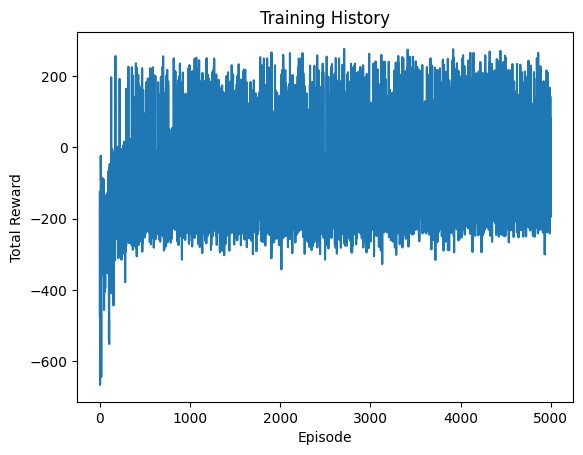

In [8]:
torch.save(agent.model.state_dict(), "./dqn_model.ckpt")
plt.plot(reward_history)
plt.xlabel("Episode")
plt.ylabel("Total Reward")
plt.title("Training History")
plt.show()

### Testing the DQN Agent (15%)

Test your DQN agent for 10 episodes and calculate the average reward.

You will get full points if the average reward is greater than 250.

Do not modify the cell below, or you will get zero points for this question.

Reward: -7.326806011676581
Reward: -210.8960641658631
Reward: -191.5268967996549
Reward: -60.03124323218648
Reward: -206.54780926857563
Reward: -222.68663499225974
Reward: -15.625826001229655
Reward: 73.91153936138001
Reward: -88.40339809804199
Reward: 206.6935252733884
Average reward: -72.24396139347198


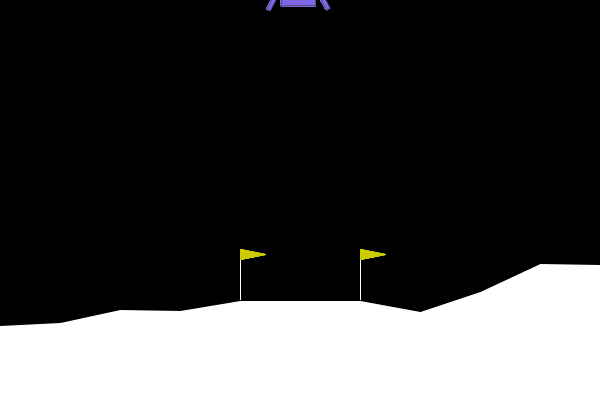

In [ ]:
frames = [] # Uncomment to store the frames for the animation
agent = DQNAgent(state_size, action_size)
agent.model.load_state_dict(torch.load("./dqn_model.ckpt"))

reward_history = []
for _ in range(10):

    state, _ = env.reset()
    total_reward = 0
    done = False

    while not done:
        action = agent.get_action(state)
        next_state, reward, terminated, truncated, _ = env.step(action)
        done = terminated or truncated

        total_reward += reward
        state = next_state
        frames.append(env.render()) # Uncomment to store the frames for the animation

    print(f"Reward: {total_reward}")
    reward_history.append(total_reward)

env.close()

print("Average reward:", np.mean(reward_history))

# Uncomment to show the animation
gif_path = "DQN.gif"
imageio.mimsave(gif_path, frames, fps=30)
Image(filename=gif_path)


## Question 3: Improving the DQN Agent (15%)

In this question, you need to improve the DQN agent by implementing one or more of the following DQN variants:

1. Double DQN
2. Dueling DQN
3. Prioritized Experience Replay
4. Deep Recurrent Q-Network (DRQN)
5. Rainbow DQN

After training, plot the reward history curve and compare the performance of your improved DQN agent with the original DQN implementation.  

Next, test your improved DQN agent for 10 episodes and compute the average reward over these trials.  

You will receive 10 points only if both of the following conditions are met:

- The average reward is greater than 270
- The average reward is higher than your original DQN agent


This final evaluation will help you assess whether your modifications have effectively improved the agent's performance. 🚀

### DQN Variants

In [7]:
# TODO: Implement your own DQN variant here, you may also need to create other classes
class DQNVariant:
    def __init__(self, state_size, action_size, lr=1e-4, gamma=0.99, tau=1e-3, batch_size=128):
        # TODO: Initialize some parameters, networks, optimizer, replay buffer, etc.
        self.model = QNet(state_size, action_size).to('cuda')
        self.model_target = QNet(state_size, action_size).to('cuda')
        self.replay_buffer = ReplayBuffer(50000)
        self.optimizer = torch.optim.AdamW(self.model.parameters(), lr=lr, amsgrad=True)
        self.gamma = gamma
        self.tau = tau
        self.batch_size = batch_size
        self.loss_fn = torch.nn.MSELoss()

    def get_action(self, state, deterministic=True):
        # TODO: Implement the action selection
        state = torch.tensor(state).unsqueeze(dim=0).to('cuda')
        out = self.model(state).squeeze(dim=0)
        if deterministic:
            return torch.argmax(out).cpu().item()
        else:
            return torch.multinomial(torch.nn.functional.softmax(out), 1).cpu().item()


    def update(self, target, learning):
        # TODO: Implement hard update or soft update
        q_target_network_state_dict = target.state_dict()
        q_network_state_dict = learning.state_dict()
        for key in q_network_state_dict:
            q_target_network_state_dict[key] = q_network_state_dict[key]*self.tau + q_target_network_state_dict[key]*(1-self.tau)

        target.load_state_dict(q_target_network_state_dict)

    def train(self):
        # TODO: Sample a batch from the replay buffer
        if len(self.replay_buffer) < self.batch_size:
            return

        batch = self.replay_buffer.sample(self.batch_size)

        obs_batch = batch['obs'].to('cuda')
        action_batch = batch['action'].to('cuda')
        reward_batch = batch['reward'].to('cuda')
        next_obs_batch = batch['next_obs'].to('cuda')
        done_batch = batch['done'].to('cuda')

        next_state_values = torch.zeros(action_batch.shape, dtype=torch.float32, device='cuda')

        with torch.no_grad():
            next_actions = self.model(next_obs_batch).argmax(dim=1, keepdim=True)
            next_state_values = self.model_target(next_obs_batch).gather(1, next_actions)

        state_action_values = self.model(obs_batch).gather(1, action_batch)
        expected_state_action_values = reward_batch + (next_state_values * self.gamma) * (1 - done_batch.float())

        # TODO: Compute loss and update the model
        loss = self.loss_fn(state_action_values.float(), expected_state_action_values.float())

        # TODO: Update target network periodically
        self.optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(self.model.parameters(), max_norm=1.0)
        self.optimizer.step()

        self.update(self.model_target, self.model)


### Training the Improved DQN Agent

/tmp/ipykernel_320640/3347694368.py:31: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at /pytorch/torch/csrc/utils/tensor_new.cpp:254.)
  'obs': torch.tensor([self.data['obs'][idx] for idx in indices]),


Episode 100, Reward: -222.4031394702394
Episode 200, Reward: -241.884672930908
Episode 300, Reward: -216.9854054187865
Episode 400, Reward: -214.5417043473212
Episode 500, Reward: -203.9196222475874
Episode 600, Reward: -216.32771614792833
Episode 700, Reward: -198.62933022740825
Episode 800, Reward: -202.382120251488
Episode 900, Reward: -169.03701854215456
Episode 1000, Reward: -153.5148706987518
Episode 1100, Reward: -117.90539139217577
Episode 1200, Reward: -98.15538793568665
Episode 1300, Reward: -90.13897054902554
Episode 1400, Reward: -108.39517088904975
Episode 1500, Reward: -112.7007333876916
Episode 1600, Reward: -105.40632877566172
Episode 1700, Reward: -107.14659407436535
Episode 1800, Reward: -86.27232746328768
Episode 1900, Reward: -79.7363407225303
Episode 2000, Reward: -72.99399845887413
Episode 2100, Reward: -48.251967924432904
Episode 2200, Reward: -34.831722771167335
Episode 2300, Reward: -26.30322384617498
Episode 2400, Reward: 6.361524939749784
Episode 2500, Reward

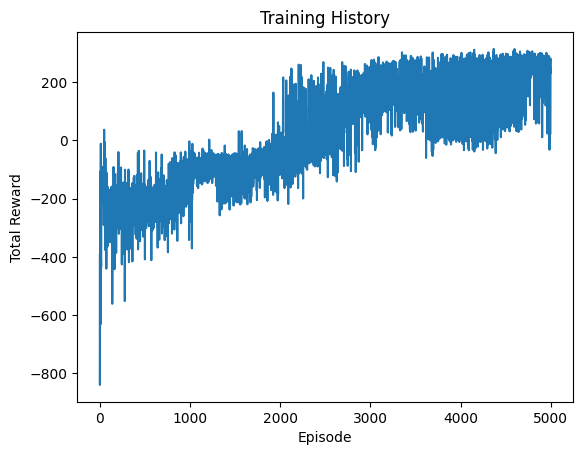

In [8]:
# TODO: Instantiate the agent and train it
agent = DQNVariant(state_size, action_size)
num_episodes = 5000
reward_history = [] # Store the total rewards for each episode
train_interval = 5
log_interval = 100
step = 0

for episode in range(num_episodes):
    # TODO: Reset the environment
    obs, _ = env.reset(seed=episode)
    done = False
    total_reward = 0

    while not done:
        # TODO: Select an action from the agent
        action = agent.get_action(obs)

        # TODO: Add the experience to the replay buffer and train the agent
        next_obs, reward, terminated, truncated, info = env.step(action)
        done = terminated or truncated
        total_reward += reward
        agent.replay_buffer.add(obs, action, reward, next_obs, done)
        obs = next_obs.copy()

        # TODO: Update the state and total reward
        step += 1
        if step % train_interval == 0:
            agent.train()

    reward_history.append(total_reward)

    if (episode+1) % log_interval == 0:
        print(f"Episode {episode+1}, Reward: {sum(reward_history[-100:])/100}")

# TODO: Plot the reward history to see how the agent's performance changes over time
plt.plot(reward_history)
plt.xlabel("Episode")
plt.ylabel("Total Reward")
plt.title("Training History")
plt.show()

torch.save(agent.model.state_dict(), "./double_dqn_model.ckpt")

### Discussion: Comparing the Performance of Two Agents (5%)  

Compare your improved DQN agent with the original in 150 words or less by addressing the following:

- What method(s) you used
- Why it improved performance
- Results comparison

TODO: Write down your answer here.

### Testing the Improved DQN Agent (10%)

You will receive full points only if both of the following conditions are met:

- The average reward is greater than 270
- The average reward is higher than your original DQN agent

Do not modify the cell below, or you will get 0 points for this question.

Reward: 284.14103278335676
Reward: 265.74213815037183
Reward: 247.4227935919982
Reward: 259.15943383901447
Reward: 279.64666124936866
Reward: 263.23289220831316
Reward: 279.002956102968
Reward: 296.7085661128414
Reward: 240.977637195104
Reward: 278.9606521055264
Average reward: 269.49947633388626


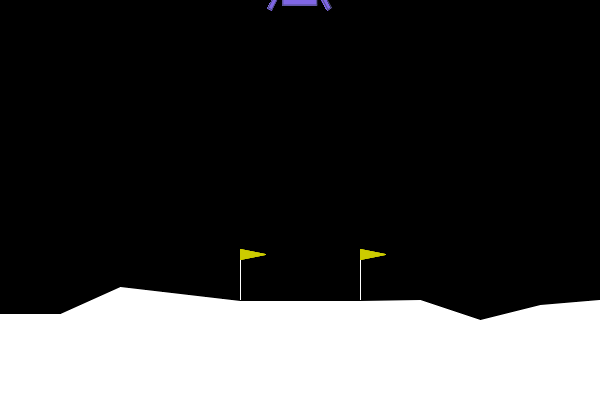

In [10]:
frames = [] # Uncomment to store the frames for the animation
agent = DQNAgent(state_size, action_size)
agent.model.load_state_dict(torch.load("./dqn_model.ckpt"))
reward_history = []
for _ in range(10):

    state, _ = env.reset()
    total_reward = 0
    done = False

    while not done:
        action = agent.get_action(state)
        next_state, reward, terminated, truncated, _ = env.step(action)
        done = terminated or truncated

        total_reward += reward
        state = next_state
        frames.append(env.render()) # Uncomment to store the frames for the animation

    print(f"Reward: {total_reward}")
    reward_history.append(total_reward)

env.close()

print("Average reward:", np.mean(reward_history))

# Uncomment to show the animation
gif_path = "DQN_variant.gif"
imageio.mimsave(gif_path, frames, fps=30)
Image(filename=gif_path)